# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_otsu_results = pickle.load(open('results/evaluation/PSO/PSO_otsu_RGB_df.pkl', 'rb'))
ga_otsu_results = pickle.load(open('results/evaluation/GA/GA_otsu_RGB_df.pkl', 'rb'))
woa_otsu_results = pickle.load(open('results/evaluation/WOA/WOA_otsu_RGB_df.pkl', 'rb'))
gwo_otsu_results = pickle.load(open('results/evaluation/GWO/GWO_otsu_RGB_df.pkl', 'rb'))
sma_otsu_results = pickle.load(open('results/evaluation/SMA/SMA_otsu_RGB_df.pkl', 'rb'))
mem_gwo_otsu_results = pickle.load(open('results/evaluation/memGWO/memGWO_otsu_RGB_df.pkl', 'rb'))

In [4]:
mem_gwo_otsu_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds R,Mean best_thresholds G,Mean best_thresholds B,Mean Fitness R,Mean Fitness G,Mean Fitness B,...,Regions B,Fitness R,Fitness G,Fitness B,CPU_time (seconds),MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,otsu,max,"[121, 178]","[94, 166]","[125, 182]",930.780721,2436.358480,1787.922710,...,"[[125, 255, 255, 255, 255, 255, 255, 255, 255,...","[930.7811479817464, 930.7811479817464, 930.781...","[2436.3584799702053, 2436.3584799702053, 2436....","[1787.9236630530743, 1787.9236630530743, 1787....","[1.783797264099121, 1.656202793121338, 1.95896...","[2293.7582194010415, 2293.7582194010415, 2293....","[47.893195961441556, 47.893195961441556, 47.89...","[14.525327230279872, 14.525327230279872, 14.52...","[0.7809698970724323, 0.7809698970724323, 0.780...","[0.941043257168062, 0.941043257168062, 0.94104..."
1,AirplaneF16.tiff,3,otsu,max,"[107, 158, 196]","[78, 138, 189]","[122, 173, 201]",971.128000,2534.074737,1856.439291,...,"[[122, 255, 201, 255, 255, 201, 201, 201, 201,...","[971.1290558159712, 971.1290558159712, 971.129...","[2534.075361427361, 2534.075361427361, 2534.07...","[1856.4464905049515, 1856.4198748283472, 1856....","[4.51273512840271, 3.3638978004455566, 3.48564...","[1572.9299570719402, 1572.7307955423992, 1573....","[39.6601810015025, 39.65767007203524, 39.67010...","[16.163709770459146, 16.164259701047374, 16.16...","[0.7344375813345811, 0.7343920008887942, 0.734...","[0.9584716610352234, 0.9585050798524942, 0.958..."
2,AirplaneF16.tiff,4,otsu,max,"[84, 127, 170, 200]","[67, 117, 165, 202]","[113, 151, 181, 204]",994.896619,2587.612959,1901.876773,...,"[[113, 204, 204, 255, 204, 204, 204, 204, 204,...","[994.9228621596616, 994.9167971396116, 994.916...","[2587.651267179317, 2587.6087197136694, 2587.6...","[1901.8096584477273, 1901.8973100660207, 1901....","[3.33612060546875, 3.305786609649658, 3.120724...","[1160.2566973368328, 1144.7434399922688, 1160....","[34.06254097005731, 33.83405739772085, 34.0686...","[17.485262768963988, 17.54372197406609, 17.483...","[0.7173998358423077, 0.7161500236492726, 0.717...","[0.9695165815943976, 0.9696727208879978, 0.969..."
3,AirplaneF16.tiff,5,otsu,max,"[76, 113, 149, 180, 202]","[60, 103, 142, 181, 206]","[109, 146, 171, 193, 208]",1006.660370,2618.815077,1923.362398,...,"[[109, 208, 208, 208, 208, 208, 208, 208, 208,...","[1006.933052245426, 1006.8833928369396, 1006.9...","[2619.0002508259377, 2619.0362799939194, 2619....","[1923.3295077310652, 1923.5110505386747, 1923....","[4.891283750534058, 3.9234070777893066, 3.7954...","[837.6814473470052, 857.9579467773438, 857.298...","[28.94272701987505, 29.290919186282697, 29.279...","[18.900014639095087, 18.796143596510642, 18.79...","[0.728726642343755, 0.7277618825788146, 0.7276...","[0.9772848592246767, 0.9770703731793143, 0.977..."
4,Lena.png,2,otsu,max,"[137, 196]","[78, 146]","[96, 141]",1004.913932,2393.647254,2181.865306,...,"[[141, 141, 141, 141, 141, 141, 141, 141, 141,...","[1004.9139322682681, 1004.9139322682681, 1004....","[2393.647254097627, 2393.647254097627, 2393.64...","[2181.8670821363294, 2181.8670821363294, 2181....","[4.767527341842651, 3.769305944442749, 3.66043...","[1858.9784520467122, 1858.9784520467122, 1858....","[43.115872391112674, 43.115872391112674, 43.11...","[15.43806005098941, 15.43806005098941, 15.4380...","[0.6394589731037388, 0.6394589731037388, 0.639...","[0.8954769944582632, 0.8954769944582632, 0.895..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value R
pso_fitness_r = pso_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
gwo_fitness_r = gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
mem_gwo_fitness_r= mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
ga_fitness_r = ga_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
woa_fitness_r = woa_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()
sma_fitness_r = sma_otsu_results[['image_name', 'thresholds', 'Mean Fitness R', 'Fitness R']].copy()

pso_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R PSO','Fitness R': 'Fitness R PSO'}, inplace=True)
gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GWO','Fitness R': 'Fitness R GWO'}, inplace=True)
mem_gwo_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R MemoryGWO','Fitness R': 'Fitness R MemoryGWO'}, inplace=True)
ga_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R GA', 'Fitness R': 'Fitness R GA'}, inplace=True)
woa_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R WOA','Fitness R': 'Fitness R WOA'}, inplace=True)
sma_fitness_r.rename(columns={'Mean Fitness R': 'Mean Fitness R SMA', 'Fitness R': 'Fitness R SMA'}, inplace=True)

### ======== Fitness Value G
pso_fitness_g = pso_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
gwo_fitness_g = gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
mem_gwo_fitness_g= mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
ga_fitness_g = ga_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
woa_fitness_g = woa_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()
sma_fitness_g = sma_otsu_results[['image_name', 'thresholds', 'Mean Fitness G', 'Fitness G']].copy()

pso_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G PSO','Fitness G': 'Fitness G PSO'}, inplace=True)
gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GWO','Fitness G': 'Fitness G GWO'}, inplace=True)
mem_gwo_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G MemoryGWO','Fitness G': 'Fitness G MemoryGWO'}, inplace=True)
ga_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G GA', 'Fitness G': 'Fitness G GA'}, inplace=True)
woa_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G WOA','Fitness G': 'Fitness G WOA'}, inplace=True)
sma_fitness_g.rename(columns={'Mean Fitness G': 'Mean Fitness G SMA', 'Fitness G': 'Fitness G SMA'}, inplace=True)

### ======== Fitness Value B
pso_fitness_b = pso_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
gwo_fitness_b = gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
mem_gwo_fitness_b= mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
ga_fitness_b = ga_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
woa_fitness_b = woa_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()
sma_fitness_b = sma_otsu_results[['image_name', 'thresholds', 'Mean Fitness B', 'Fitness B']].copy()

pso_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B PSO','Fitness B': 'Fitness B PSO'}, inplace=True)
gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GWO','Fitness B': 'Fitness B GWO'}, inplace=True)
mem_gwo_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B MemoryGWO','Fitness B': 'Fitness B MemoryGWO'}, inplace=True)
ga_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B GA', 'Fitness B': 'Fitness B GA'}, inplace=True)
woa_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B WOA','Fitness B': 'Fitness B WOA'}, inplace=True)
sma_fitness_b.rename(columns={'Mean Fitness B': 'Mean Fitness B SMA', 'Fitness B': 'Fitness B SMA'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Threshold R
pso_threshold_r = pso_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
gwo_threshold_r = gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
mem_gwo_threshold_r = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
ga_threshold_r = ga_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
woa_threshold_r = woa_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()
sma_threshold_r = sma_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds R']].copy()

pso_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R PSO'}, inplace=True)
gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GWO'}, inplace=True)
mem_gwo_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R MemoryGWO'}, inplace=True)
ga_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R GA'}, inplace=True)
woa_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R WOA'}, inplace=True)
sma_threshold_r.rename(columns={'Mean best_thresholds R': 'Thresholds R SMA'}, inplace=True)

### ========== Threshold G
pso_threshold_g = pso_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
gwo_threshold_g = gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
mem_gwo_threshold_g = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
ga_threshold_g = ga_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
woa_threshold_g = woa_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()
sma_threshold_g = sma_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds G']].copy()

pso_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G PSO'}, inplace=True)
gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GWO'}, inplace=True)
mem_gwo_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G MemoryGWO'}, inplace=True)
ga_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G GA'}, inplace=True)
woa_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G WOA'}, inplace=True)
sma_threshold_g.rename(columns={'Mean best_thresholds G': 'Thresholds G SMA'}, inplace=True)

### ========== Threshold B
pso_threshold_b = pso_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
gwo_threshold_b = gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
mem_gwo_threshold_b = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
ga_threshold_b = ga_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
woa_threshold_b = woa_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()
sma_threshold_b = sma_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds B']].copy()

pso_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B PSO'}, inplace=True)
gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GWO'}, inplace=True)
mem_gwo_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B MemoryGWO'}, inplace=True)
ga_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B GA'}, inplace=True)
woa_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B WOA'}, inplace=True)
sma_threshold_b.rename(columns={'Mean best_thresholds B': 'Thresholds B SMA'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = pso_psnr.merge(gwo_psnr, on=on).merge(mem_gwo_psnr, on=on).merge(ga_psnr, on=on).merge(sma_psnr, on=on).merge(woa_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = pso_rmse.merge(gwo_rmse, on=on).merge(mem_gwo_rmse, on=on).merge(ga_rmse, on=on).merge(sma_rmse, on=on).merge(woa_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = pso_ssim.merge(gwo_ssim, on=on).merge(mem_gwo_ssim, on=on).merge(ga_ssim, on=on).merge(sma_ssim, on=on).merge(woa_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = pso_uqi.merge(gwo_uqi, on=on).merge(mem_gwo_uqi, on=on).merge(ga_uqi, on=on).merge(sma_uqi, on=on).merge(woa_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = pso_cpu_time.merge(gwo_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on).merge(ga_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(woa_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Fitness Value R
fitness_r_merge = pso_fitness_r.merge(gwo_fitness_r, on=on).merge(mem_gwo_fitness_r, on=on).merge(ga_fitness_r, on=on).merge(sma_fitness_r, on=on).merge(woa_fitness_r, on=on)
fitness_r_merge = fitness_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value G
fitness_g_merge = pso_fitness_g.merge(gwo_fitness_g, on=on).merge(mem_gwo_fitness_g, on=on).merge(ga_fitness_g, on=on).merge(sma_fitness_g, on=on).merge(woa_fitness_g, on=on)
fitness_g_merge = fitness_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value B
fitness_b_merge = pso_fitness_b.merge(gwo_fitness_b, on=on).merge(mem_gwo_fitness_b, on=on).merge(ga_fitness_b, on=on).merge(sma_fitness_b, on=on).merge(woa_fitness_b, on=on)
fitness_b_merge = fitness_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Threshold R
threshold_r_merge = pso_threshold_r.merge(gwo_threshold_r, on=on).merge(mem_gwo_threshold_r, on=on).merge(ga_threshold_r, on=on).merge(sma_threshold_r, on=on).merge(woa_threshold_r, on=on)
threshold_r_merge = threshold_r_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold G
threshold_g_merge = pso_threshold_g.merge(gwo_threshold_g, on=on).merge(mem_gwo_threshold_g, on=on).merge(ga_threshold_g, on=on).merge(sma_threshold_g, on=on).merge(woa_threshold_g, on=on)
threshold_g_merge = threshold_g_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Threshold B
threshold_b_merge = pso_threshold_b.merge(gwo_threshold_b, on=on).merge(mem_gwo_threshold_b, on=on).merge(ga_threshold_b, on=on).merge(sma_threshold_b, on=on).merge(woa_threshold_b, on=on)
threshold_b_merge = threshold_b_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def findMinimumMetrics(list_of_values):
    return min(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMinimumMetrics)
    fitness_r_merge[f'Best Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(findMaximumMetrics)
    fitness_g_merge[f'Best Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(findMaximumMetrics)    
    fitness_b_merge[f'Best Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_r_merge[f'Std Fitness R {algo}'] = fitness_r_merge[f'Fitness R {algo}'].apply(calculateStandardDeviation)
    fitness_g_merge[f'Std Fitness G {algo}'] = fitness_g_merge[f'Fitness G {algo}'].apply(calculateStandardDeviation)    
    fitness_b_merge[f'Std Fitness B {algo}'] = fitness_b_merge[f'Fitness B {algo}'].apply(calculateStandardDeviation)    

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR PSO   
image_name                                            
AirplaneF16.tiff      0            2      14.524391  \
                      1            3      16.203543   
                      2            4      17.345938   
                      3            5      18.683063   
Lena.png              4            2      15.435867   
                      5            3      17.431104   
                      6            4      19.430245   
                      7            5      20.833459   
Male.tiff             8            2      11.560668   
                      9            3      14.217964   
                      10           4      17.767520   
                      11           5      19.526424   
Mandrill.tiff         12           2      14.767385   
                      13           3      16.975929   
                      14           4      18.267693   
                      15           5      19.344799   
Peppers.tiff          16           2      13.856470   
                      17           3      15.217014   
                      18           4      17.278970   
                      19           5      18.483036   
Sailboat on lake.tiff 20           2      14.804575   
                      21           3      16.508903   
                      22           4      18.759749   
                      23           5      19.875513   

                                                                   PSNR PSO   
image_name                                                                    
AirplaneF16.tiff      0   [14.534283071740466, 14.525327230279872, 14.51...  \
                      1   [16.26959797540694, 16.18861315770791, 16.1668...   
                      2   [17.396361187747505, 17.31000368365249, 17.483...   
                      3   [18.66868425355403, 18.309068802184033, 18.952...   
Lena.png              4   [15.43806005098941, 15.431203393928147, 15.438...   
                      5   [17.351908902138323, 17.41543050632324, 17.477...   
                      6   [19.22365245228385, 19.515342415907245, 19.561...   
                      7   [20.77987600295005, 20.597991623128568, 21.130...   
Male.tiff             8   [11.559995982587534, 11.559995982587534, 11.55...   
                      9   [14.2255502769329, 14.255920955492005, 14.2533...   
                      10  [17.86316884498537, 17.297593850623347, 17.843...   
                      11  [19.732111374302534, 19.798734165777326, 19.74...   
Mandrill.tiff         12  [14.797570784222442, 14.797570784222442, 14.28...   
                      13  [16.991039331285258, 17.01618786836572, 17.012...   
                      14  [17.982009638436733, 18.380447204163794, 18.42...   
                      15  [19.68410781707817, 19.78419719190471, 19.5940...   
Peppers.tiff          16  [13.8566325389659, 13.8566325389659, 13.855656...   
                      17  [15.104569639433647, 15.256371237791084, 15.29...   
                      18  [17.035068531815615, 17.546322480957105, 17.60...   
                      19  [18.856877667368252, 18.655953528098223, 18.06...   
Sailboat on lake.tiff 20  [14.855584053834388, 14.855584053834388, 14.85...   
                      21  [16.53395941197577, 16.51170946324718, 16.5278...   
                      22  [18.785404805663475, 18.129338420133934, 18.89...   
                      23  [19.484288427081502, 19.902317026128564, 19.94...   

                          Mean PSNR GWO   
image_name                                
AirplaneF16.tiff      0       14.525553  \
                      1       16.158391   
                      2       17.457999   
                      3       18.708950   
Lena.png              4       15.438060   
                      5       17.443447   
                      6       19.417586   
                      7       20.650125   
Male.tiff             8       11.559876   
                      9       14.224506   
                      10

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_otsu_RGB.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_otsu_RGB.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_otsu_RGB.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_otsu_RGB.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE PSO   
image_name                                            
AirplaneF16.tiff      0            2      47.898384  \
                      1            3      39.480770   
                      2            4      34.642555   
                      3            5      29.709021   
Lena.png              4            2      43.126778   
                      5            3      34.276317   
                      6            4      27.232859   
                      7            5      23.172900   
Male.tiff             8            2      67.376248   
                      9            3      49.618979   
                      10           4      32.979342   
                      11           5      26.946027   
Mandrill.tiff         12           2      46.581780   
                      13           3      36.121816   
                      14           4      31.139619   
                      15           5      27.525225   
Peppers.tiff          16           2      51.726928   
                      17           3      44.239007   
                      18           4      34.907026   
                      19           5      30.386512   
Sailboat on lake.tiff 20           2      46.402468   
                      21           3      38.115093   
                      22           4      29.437874   
                      23           5      25.871647   

                                                                   RMSE PSO   
image_name                                                                    
AirplaneF16.tiff      0   [47.843839725449286, 47.893195961441556, 47.96...  \
                      1   [39.17962560880165, 39.54663381675064, 39.6457...   
                      2   [34.4129672398309, 34.75681691806368, 34.07057...   
                      3   [29.723912060513708, 30.98037999198582, 28.768...   
Lena.png              4   [43.115872391112674, 43.14992157658965, 43.115...   
                      5   [34.589535928336936, 34.33749863131936, 34.092...   
                      6   [27.884159470666845, 26.96330098327263, 26.819...   
                      7   [23.310220424548717, 23.803487946338, 22.38781...   
Male.tiff             8   [67.3814544770875, 67.3814544770875, 67.381454...   
                      9   [49.57499357445656, 49.40195464914551, 49.4168...   
                      10  [32.612323237162215, 34.80651068402303, 32.685...   
                      11  [26.29872003082865, 26.097774373452225, 26.245...   
Mandrill.tiff         12  [46.41535123722381, 46.41535123722381, 49.2271...   
                      13  [36.056885756641954, 35.95264007537535, 35.967...   
                      14  [32.16915835149845, 30.72683442829022, 30.5538...   
                      15  [26.444465266770717, 26.141488987670787, 26.72...   
Peppers.tiff          16  [51.725959267685624, 51.725959267685624, 51.73...   
                      17  [44.80347488301115, 44.02725596528176, 43.8215...   
                      18  [35.87457409826312, 33.82392918596822, 33.6130...   
                      19  [29.086823597403875, 29.767509714500214, 31.84...   
Sailboat on lake.tiff 20  [46.106374948291, 46.106374948291, 46.10637494...   
                      21  [38.00512889916318, 38.102608397364904, 38.031...   
                      22  [29.327155380194853, 31.628111373375283, 28.95...   
                      23  [27.05987331690601, 25.788395918203538, 25.653...   

                          Mean RMSE GWO   
image_name                                
AirplaneF16.tiff      0       47.891950  \
                      1       39.684582   
                      2       34.170656   
                      3       29.593807   
Lena.png              4       43.115872   
                      5       34.226939   
                      6       27.268568   
                      7       23.663154   
Male.tiff             8       67.382384   
                      9       49.580956   
                      10

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_otsu_RGB.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_otsu_RGB.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_otsu_RGB.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_otsu_RGB.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM PSO   
image_name                                            
AirplaneF16.tiff      0            2       0.780804  \
                      1            3       0.733337   
                      2            4       0.722459   
                      3            5       0.731047   
Lena.png              4            2       0.639494   
                      5            3       0.699195   
                      6            4       0.752248   
                      7            5       0.784037   
Male.tiff             8            2       0.439465   
                      9            3       0.535154   
                      10           4       0.613410   
                      11           5       0.675551   
Mandrill.tiff         12           2       0.694688   
                      13           3       0.774859   
                      14           4       0.819364   
                      15           5       0.851791   
Peppers.tiff          16           2       0.560877   
                      17           3       0.604757   
                      18           4       0.662775   
                      19           5       0.703086   
Sailboat on lake.tiff 20           2       0.663461   
                      21           3       0.729304   
                      22           4       0.760713   
                      23           5       0.804468   

                                                                   SSIM PSO   
image_name                                                                    
AirplaneF16.tiff      0   [0.7801771649646593, 0.7809698970724323, 0.781...  \
                      1   [0.7305593956507269, 0.7345485140931193, 0.737...   
                      2   [0.716194599050584, 0.7186121296102325, 0.7165...   
                      3   [0.726706046132859, 0.7333140062628511, 0.7272...   
Lena.png              4   [0.6394589731037388, 0.6398948445609046, 0.639...   
                      5   [0.6979372296605552, 0.6984933033414796, 0.697...   
                      6   [0.7519254656270343, 0.7515315177130243, 0.750...   
                      7   [0.7843003103872942, 0.7810301644432571, 0.788...   
Male.tiff             8   [0.4394540666438404, 0.4394540666438404, 0.439...   
                      9   [0.5351542583000171, 0.5352393651627819, 0.535...   
                      10  [0.614532674716787, 0.6078962475273256, 0.6144...   
                      11  [0.6788250552128309, 0.6791625854793146, 0.677...   
Mandrill.tiff         12  [0.6953329660209571, 0.6953329660209571, 0.684...   
                      13  [0.7746826740994717, 0.775581221930255, 0.7755...   
                      14  [0.804718541943954, 0.8237620506851632, 0.8219...   
                      15  [0.8595889048919935, 0.8594976990739651, 0.858...   
Peppers.tiff          16  [0.5609219175324807, 0.5609219175324807, 0.560...   
                      17  [0.606870061565926, 0.6060694161589972, 0.6057...   
                      18  [0.6615494003176332, 0.6648751333448402, 0.665...   
                      19  [0.7068359857017313, 0.7078131132325485, 0.689...   
Sailboat on lake.tiff 20  [0.6648074175650792, 0.6648074175650792, 0.664...   
                      21  [0.7263296774643226, 0.7283260705381217, 0.727...   
                      22  [0.7590202927479265, 0.7645315798784561, 0.760...   
                      23  [0.7909622693643586, 0.8039782332269887, 0.805...   

                          Mean SSIM GWO   
image_name                                
AirplaneF16.tiff      0        0.780977  \
                      1        0.734588   
                      2        0.717230   
                      3        0.727179   
Lena.png              4        0.639459   
                      5        0.699528   
                      6        0.754365   
                      7        0.783634   
Male.tiff             8        0.439462   
                      9        0.535146   
                      10

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_otsu_RGB.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_otsu_RGB.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_otsu_RGB.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_otsu_RGB.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_otsu_RGB.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_otsu_RGB.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_otsu_RGB.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_otsu_RGB.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_otsu_RGB.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_otsu_RGB.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_otsu_RGB.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_otsu_RGB.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_r_merge[[f'{metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_R.xlsx')
fitness_r_merge[[f'Mean {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_R.xlsx')
fitness_r_merge[[f'Best {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_otsu_R.xlsx')
fitness_r_merge[[f'Std {metrics} R {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_otsu_R.xlsx')

fitness_g_merge[[f'{metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_G.xlsx')
fitness_g_merge[[f'Mean {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_G.xlsx')
fitness_g_merge[[f'Best {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_otsu_G.xlsx')
fitness_g_merge[[f'Std {metrics} G {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_otsu_G.xlsx')

fitness_b_merge[[f'{metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_B.xlsx')
fitness_b_merge[[f'Mean {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu_B.xlsx')
fitness_b_merge[[f'Best {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_otsu_B.xlsx')
fitness_b_merge[[f'Std {metrics} B {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_otsu_B.xlsx')

## Mean Thresholds

In [18]:
threshold_r_merge

thresholds           Thresholds R PSO   
image_name                                                        
AirplaneF16.tiff      0            2                 [121, 178]  \
                      1            3            [107, 158, 196]   
                      2            4        [84, 126, 169, 200]   
                      3            5   [77, 116, 152, 183, 203]   
Lena.png              4            2                 [137, 196]   
                      5            3            [127, 174, 211]   
                      6            4       [116, 157, 191, 218]   
                      7            5  [113, 145, 176, 202, 224]   
Male.tiff             8            2                  [57, 124]   
                      9            3              [39, 92, 142]   
                      10           4         [34, 80, 122, 162]   
                      11           5     [26, 61, 97, 132, 170]   
Mandrill.tiff         12           2                 [110, 176]   
                      13           3             [95, 145, 200]   
                      14           4        [68, 116, 158, 206]   
                      15           5   [58, 100, 133, 168, 210]   
Peppers.tiff          16           2                  [98, 160]   
                      17           3             [83, 132, 173]   
                      18           4        [73, 116, 149, 182]   
                      19           5    [46, 93, 126, 156, 186]   
Sailboat on lake.tiff 20           2                 [119, 171]   
                      21           3             [97, 134, 178]   
                      22           4        [93, 126, 158, 190]   
                      23           5   [86, 110, 137, 163, 192]   

                                   Thresholds R GWO   
image_name                                            
AirplaneF16.tiff      0                  [121, 178]  \
                      1             [106, 157, 196]   
                      2         [84, 126, 170, 200]   
                      3    [75, 113, 148, 180, 202]   
Lena.png              4                  [137, 196]   
                      5             [127, 176, 212]   
                      6        [117, 157, 191, 218]   
                      7   [110, 143, 172, 198, 221]   
Male.tiff             8                   [57, 124]   
                      9               [39, 92, 142]   
                      10         [35, 82, 124, 164]   
                      11    [28, 66, 101, 135, 172]   
Mandrill.tiff         12                 [111, 178]   
                      13             [96, 146, 200]   
                      14        [83, 122, 163, 209]   
                      15   [73, 106, 138, 172, 212]   
Peppers.tiff          16                  [98, 160]   
                      17             [84, 135, 175]   
                      18        [82, 125, 157, 187]   
                      19   [65, 104, 134, 162, 190]   
Sailboat on lake.tiff 20                 [115, 170]   
                      21             [97, 134, 178]   
                      22        [89, 124, 156, 189]   
                      23   [85, 109, 135, 162, 191]   

                             Thresholds R MemoryGWO   
image_name                                            
AirplaneF16.tiff      0                  [121, 178]  \
                      1             [107, 158, 196]   
                      2         [84, 127, 170, 200]   
                      3    [76, 113, 149, 180, 202]   
Lena.png              4                  [137, 196]   
                      5             [127, 176, 212]   
                      6        [117, 157, 191, 218]   
                      7   [111, 144, 174, 199, 222]   
Male.tiff             8                   [57, 124]   
                      9               [39, 92, 142]   
                      10         [35, 82, 124, 164]   
                      11    [29, 66, 101, 134, 172]   
Mandrill.tiff         12                 [111, 178]   
                      13   

In [19]:
threshold_r_merge.to_excel('results/evaluation/Merge/mean_thresholds_otsu_R_channel.xlsx')
threshold_g_merge.to_excel('results/evaluation/Merge/mean_thresholds_otsu_G_channel.xlsx')
threshold_b_merge.to_excel('results/evaluation/Merge/mean_thresholds_otsu_B_channel.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
rgb_misc_dataset = test_dataset_misc['rgb']
gray_misc_dataset = test_dataset_misc['gray']
rgb_misc_dataset

{'AirplaneF16.tiff': array([[[181,   0,  98],
         [185, 206, 202],
         [165, 207, 197],
         ...,
         [150, 166, 206],
         [150, 164, 202],
         [131, 147, 196]],
 
        [[141,   0, 108],
         [199, 193, 204],
         [195, 189, 200],
         ...,
         [162, 182, 204],
         [141, 155, 195],
         [119, 139, 197]],
 
        [[141,   0, 108],
         [197, 196, 203],
         [193, 193, 199],
         ...,
         [174, 195, 209],
         [144, 159, 196],
         [116, 144, 193]],
 
        ...,
 
        [[160,   0, 172],
         [210, 215, 212],
         [211, 214, 214],
         ...,
         [181, 185, 191],
         [173, 175, 190],
         [158, 144, 168]],
 
        [[163,   0, 173],
         [210, 216, 213],
         [210, 215, 215],
         ...,
         [168, 163, 177],
         [184, 182, 190],
         [167, 164, 184]],
 
        [[ 35, 127,  32],
         [ 33, 123,  34],
         [ 34, 125,  38],
         ...,
        

## 2-Level

In [21]:
mLevel = 2
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[121, 178]","[121, 178]","[121, 178]","[126, 178]","[120, 173]","[121, 178]"
Lena.png,4,2,"[137, 196]","[137, 196]","[137, 196]","[136, 193]","[136, 190]","[136, 195]"
Male.tiff,8,2,"[57, 124]","[57, 124]","[57, 124]","[60, 121]","[60, 128]","[55, 122]"
Mandrill.tiff,12,2,"[110, 176]","[111, 178]","[111, 178]","[112, 175]","[115, 184]","[104, 176]"
Peppers.tiff,16,2,"[98, 160]","[98, 160]","[98, 160]","[100, 159]","[96, 159]","[98, 160]"
Sailboat on lake.tiff,20,2,"[119, 171]","[115, 170]","[119, 171]","[119, 169]","[119, 171]","[119, 170]"


In [22]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[125, 182]","[125, 182]","[125, 182]","[125, 181]","[115, 180]","[125, 182]"
Lena.png,4,2,"[96, 141]","[96, 141]","[96, 141]","[95, 141]","[97, 148]","[96, 141]"
Male.tiff,8,2,"[57, 124]","[57, 124]","[57, 124]","[57, 123]","[58, 126]","[57, 124]"
Mandrill.tiff,12,2,"[92, 167]","[92, 167]","[92, 167]","[97, 167]","[95, 159]","[91, 167]"
Peppers.tiff,16,2,"[59, 128]","[59, 128]","[59, 128]","[59, 127]","[58, 129]","[57, 126]"
Sailboat on lake.tiff,20,2,"[69, 149]","[69, 149]","[69, 149]","[80, 154]","[83, 150]","[69, 149]"


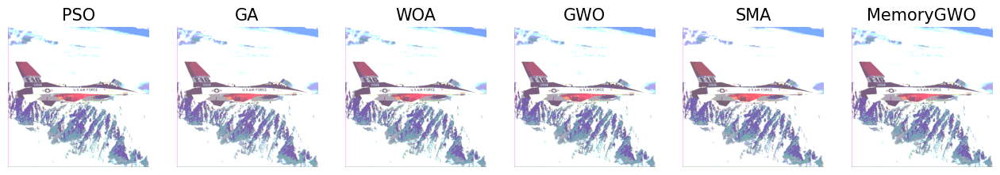

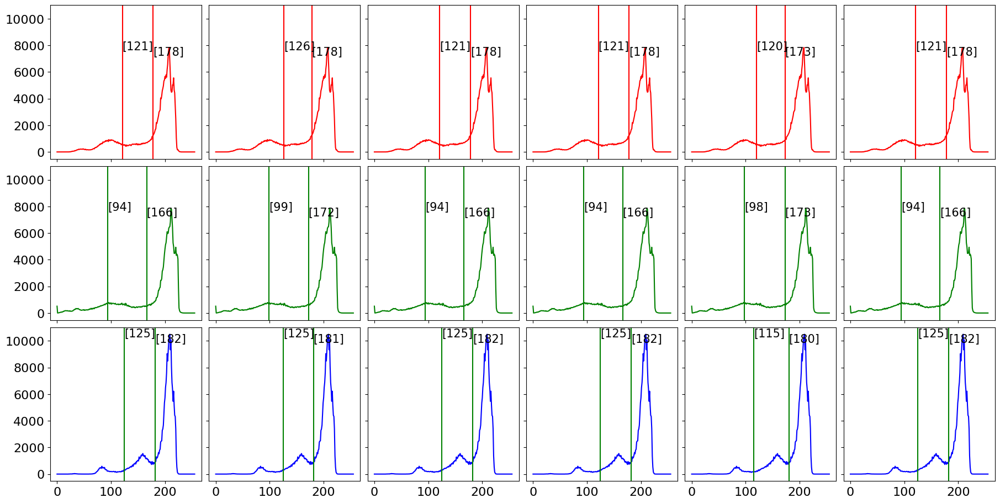

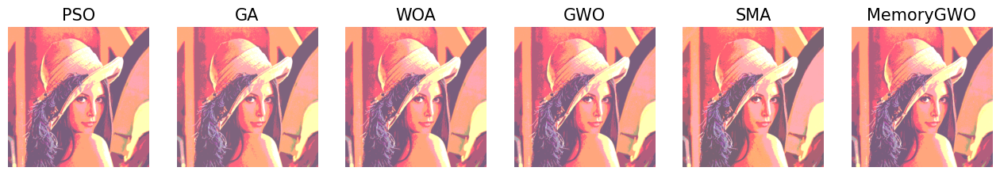

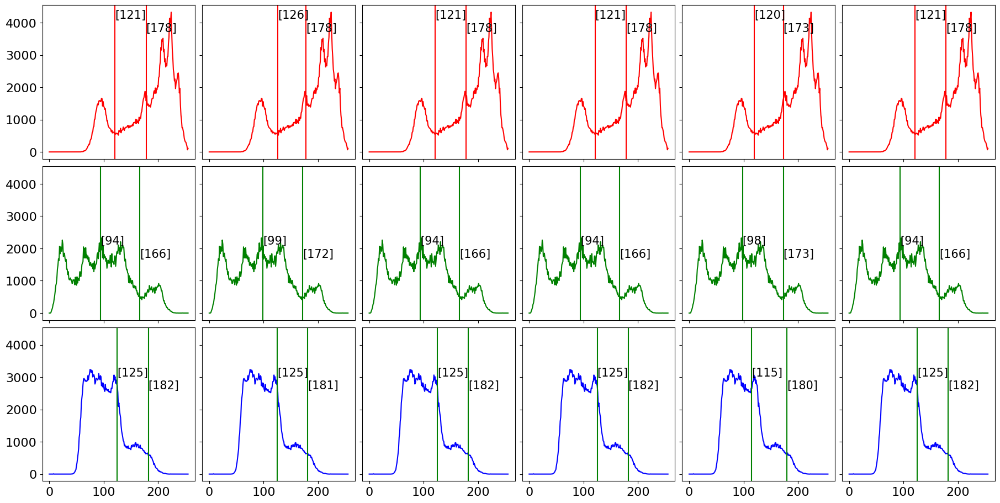

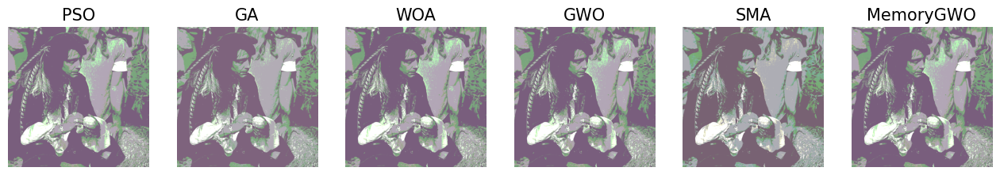

...

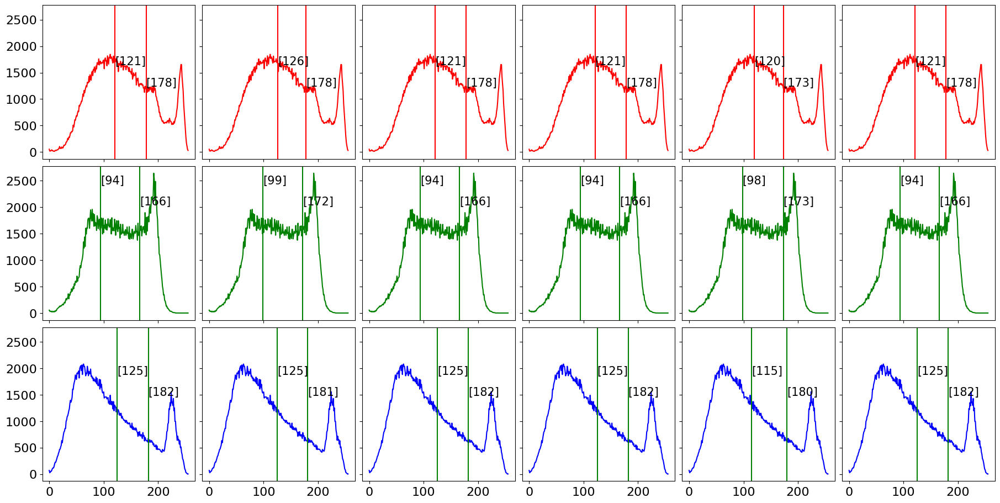

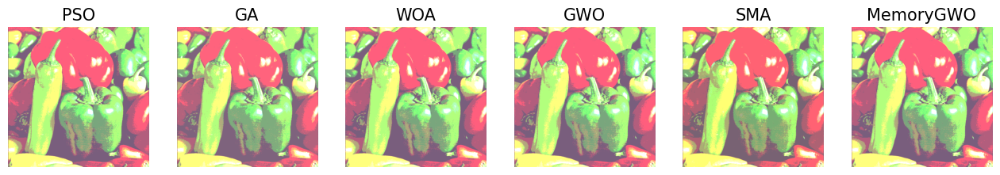

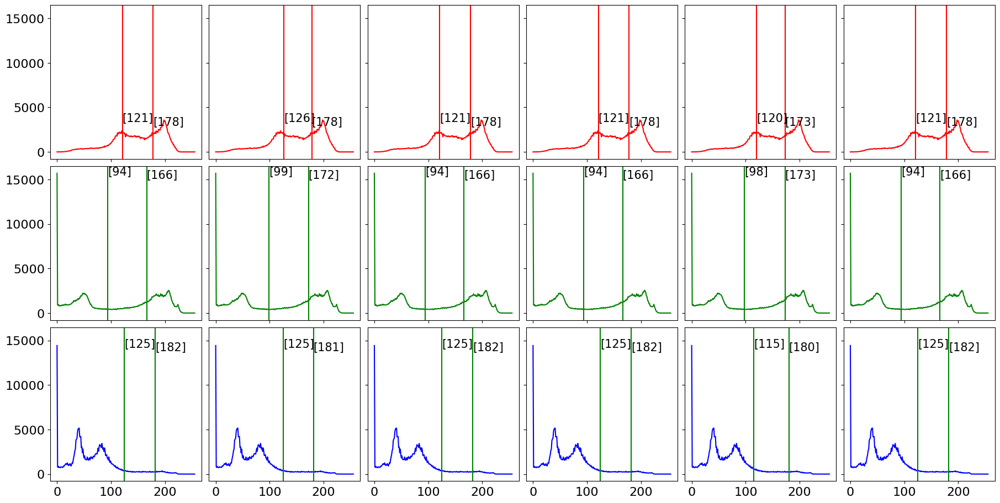

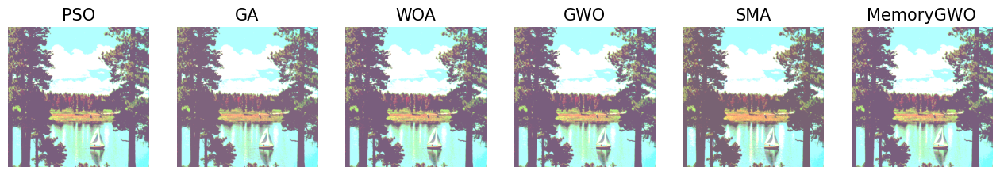

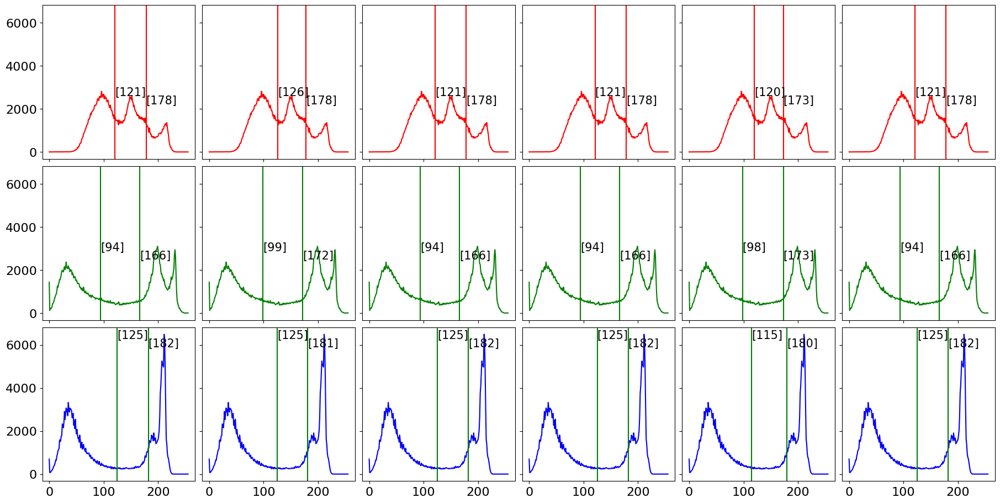

In [23]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 3-Level

In [24]:
mLevel = 3
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[107, 158, 196]","[106, 157, 196]","[107, 158, 196]","[104, 148, 188]","[85, 142, 186]","[105, 156, 195]"
Lena.png,5,3,"[127, 174, 211]","[127, 176, 212]","[127, 176, 212]","[122, 169, 208]","[112, 161, 208]","[125, 173, 210]"
Male.tiff,9,3,"[39, 92, 142]","[39, 92, 142]","[39, 92, 142]","[44, 94, 142]","[40, 96, 158]","[36, 89, 141]"
Mandrill.tiff,13,3,"[95, 145, 200]","[96, 146, 200]","[96, 146, 200]","[97, 145, 200]","[91, 144, 205]","[92, 144, 199]"
Peppers.tiff,17,3,"[83, 132, 173]","[84, 135, 175]","[87, 136, 176]","[81, 135, 177]","[64, 128, 173]","[72, 129, 173]"
Sailboat on lake.tiff,21,3,"[97, 134, 178]","[97, 134, 178]","[97, 134, 178]","[102, 136, 181]","[67, 133, 179]","[96, 134, 178]"


In [25]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[123, 173, 202]","[122, 173, 201]","[122, 173, 201]","[118, 162, 192]","[74, 142, 189]","[121, 172, 201]"
Lena.png,5,3,"[83, 111, 148]","[83, 110, 147]","[83, 110, 147]","[83, 114, 151]","[67, 124, 167]","[82, 110, 147]"
Male.tiff,9,3,"[39, 92, 142]","[39, 92, 142]","[39, 92, 142]","[44, 94, 148]","[38, 97, 161]","[34, 88, 140]"
Mandrill.tiff,13,3,"[73, 123, 184]","[73, 123, 184]","[73, 123, 184]","[68, 126, 187]","[78, 138, 198]","[65, 120, 182]"
Peppers.tiff,17,3,"[28, 67, 131]","[28, 67, 131]","[28, 67, 131]","[43, 80, 137]","[29, 85, 160]","[24, 66, 131]"
Sailboat on lake.tiff,21,3,"[52, 104, 169]","[53, 105, 170]","[53, 105, 170]","[51, 104, 164]","[61, 117, 173]","[51, 103, 169]"


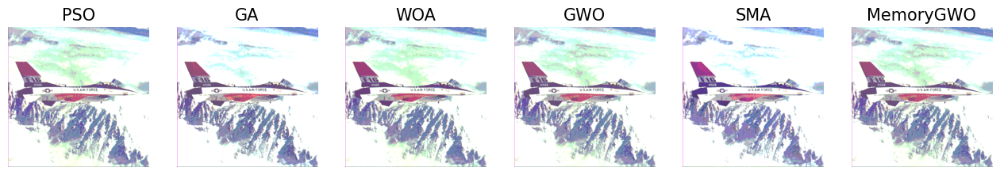

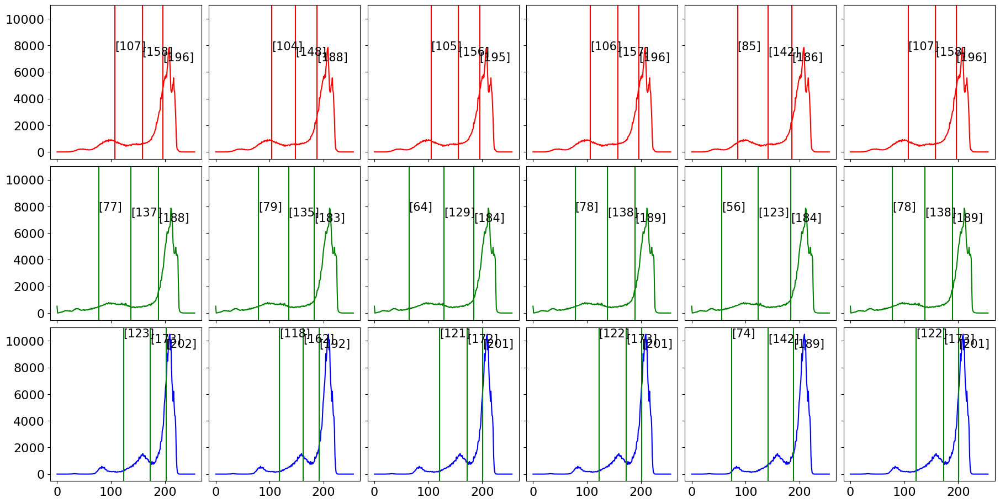

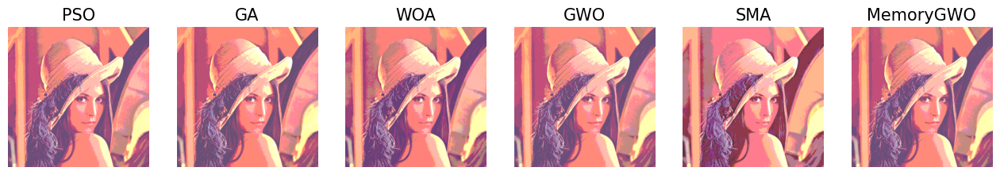

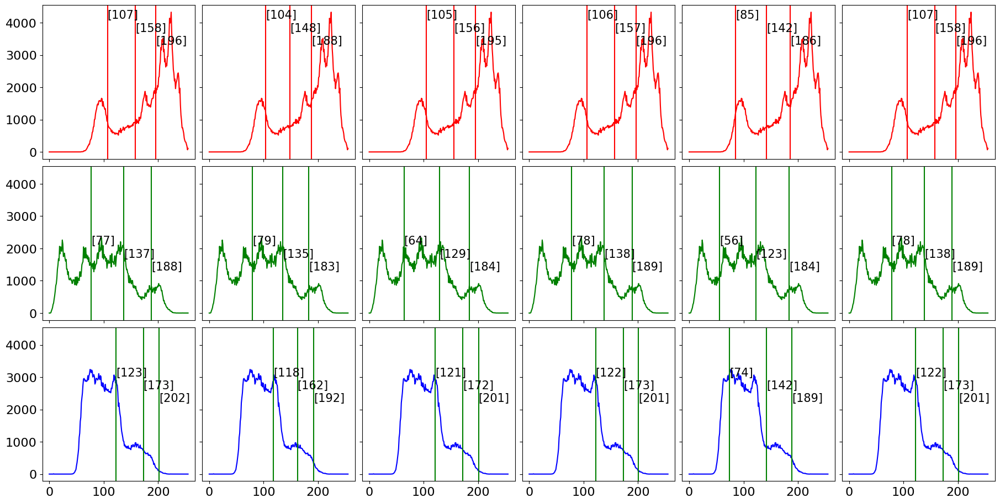

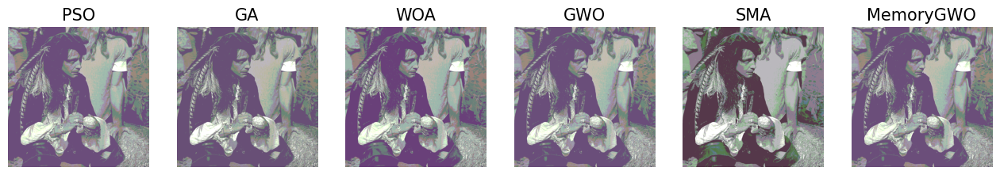

...

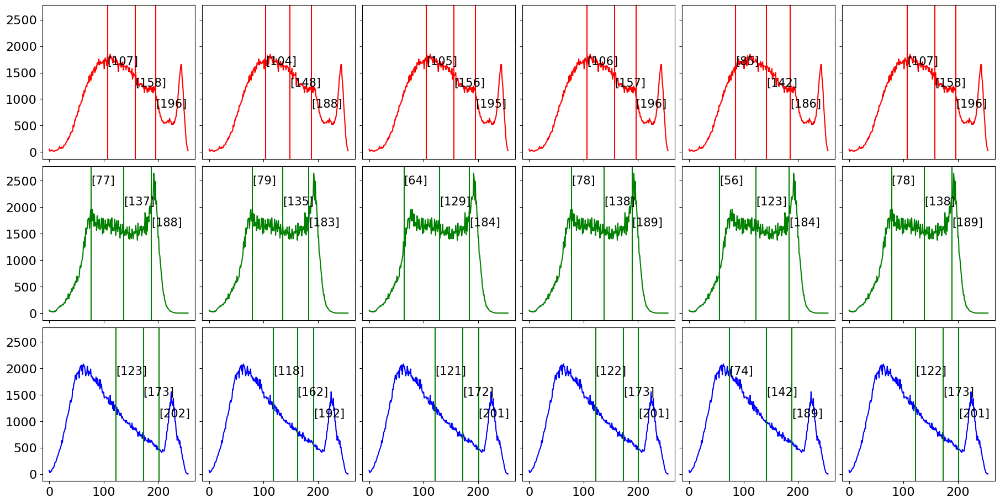

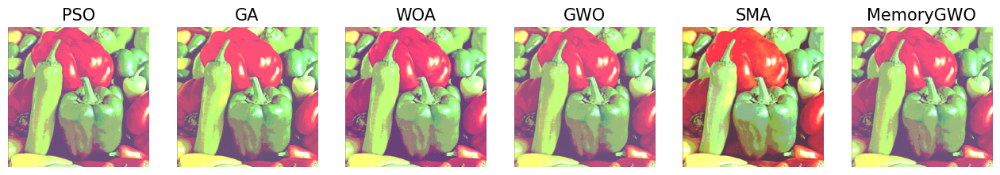

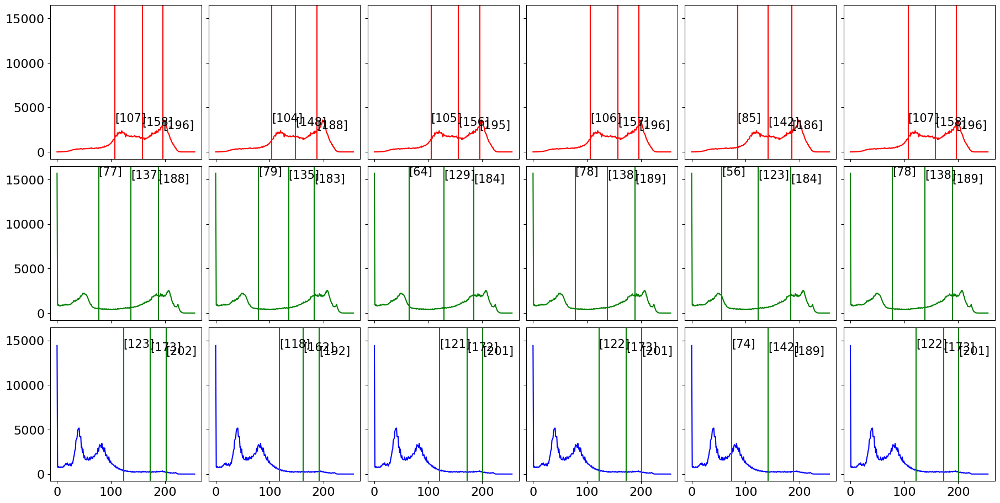

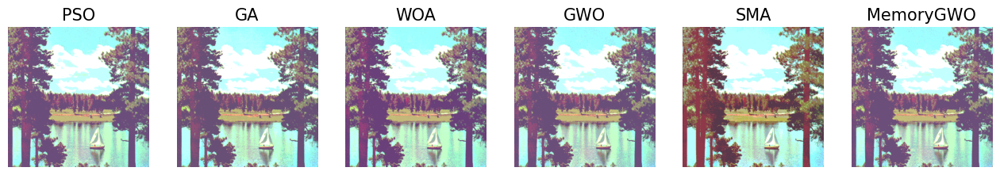

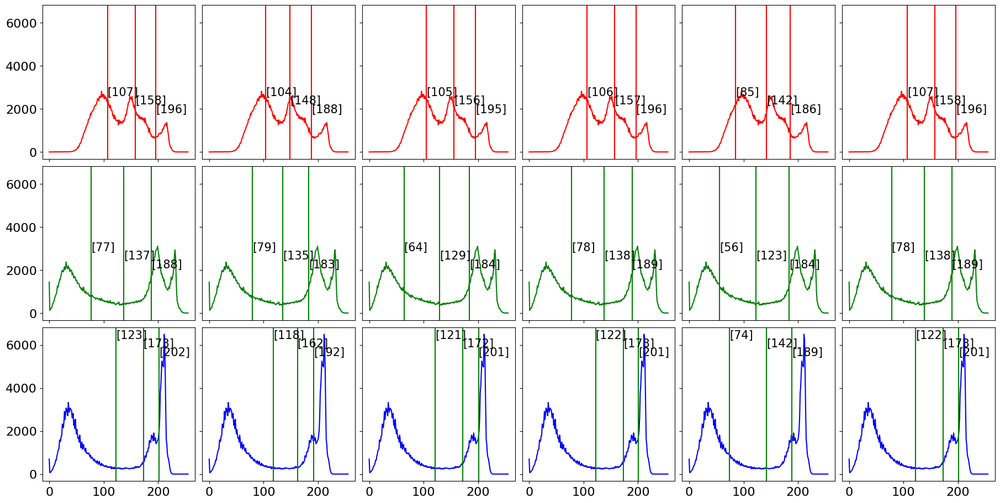

In [26]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 4-Level

In [27]:
mLevel = 4
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[84, 126, 169, 200]","[84, 126, 170, 200]","[84, 127, 170, 200]","[86, 131, 163, 194]","[70, 126, 164, 197]","[81, 125, 168, 199]"
Lena.png,6,4,"[116, 157, 191, 218]","[117, 157, 191, 218]","[117, 157, 191, 218]","[112, 150, 185, 214]","[83, 131, 172, 210]","[116, 156, 190, 217]"
Male.tiff,10,4,"[34, 80, 122, 162]","[35, 82, 124, 164]","[35, 82, 124, 164]","[39, 81, 123, 166]","[20, 57, 108, 164]","[24, 66, 112, 156]"
Mandrill.tiff,14,4,"[68, 116, 158, 206]","[83, 122, 163, 209]","[83, 123, 163, 209]","[79, 122, 161, 209]","[63, 116, 167, 217]","[54, 112, 156, 205]"
Peppers.tiff,18,4,"[73, 116, 149, 182]","[82, 125, 157, 187]","[82, 125, 157, 187]","[72, 117, 149, 185]","[46, 105, 153, 188]","[45, 104, 145, 180]"
Sailboat on lake.tiff,22,4,"[93, 126, 158, 190]","[89, 124, 156, 189]","[92, 125, 157, 189]","[82, 116, 148, 186]","[44, 112, 152, 192]","[79, 120, 153, 187]"


In [28]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[113, 153, 181, 204]","[110, 150, 181, 204]","[113, 151, 181, 204]","[99, 142, 175, 196]","[59, 119, 166, 195]","[110, 150, 180, 204]"
Lena.png,6,4,"[82, 107, 134, 165]","[81, 106, 134, 164]","[81, 106, 134, 164]","[82, 107, 131, 164]","[38, 91, 127, 168]","[70, 100, 126, 157]"
Male.tiff,10,4,"[34, 81, 123, 163]","[35, 82, 124, 164]","[35, 82, 124, 164]","[33, 79, 116, 159]","[20, 64, 117, 178]","[26, 70, 115, 158]"
Mandrill.tiff,14,4,"[60, 98, 141, 193]","[60, 99, 143, 194]","[62, 100, 143, 195]","[64, 104, 144, 192]","[43, 102, 158, 211]","[40, 90, 136, 190]"
Peppers.tiff,18,4,"[26, 61, 95, 146]","[26, 61, 96, 147]","[26, 61, 96, 147]","[29, 61, 102, 148]","[28, 62, 111, 166]","[18, 51, 88, 143]"
Sailboat on lake.tiff,22,4,"[45, 86, 144, 192]","[47, 88, 146, 193]","[47, 88, 146, 194]","[45, 86, 132, 177]","[29, 70, 132, 182]","[40, 81, 139, 190]"


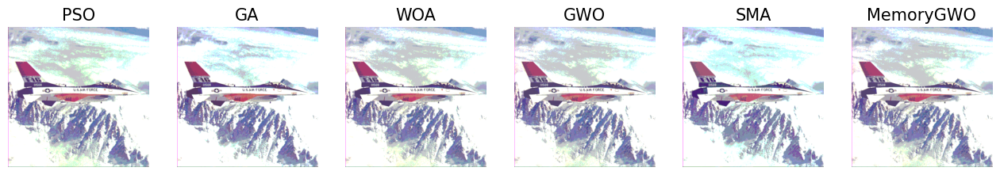

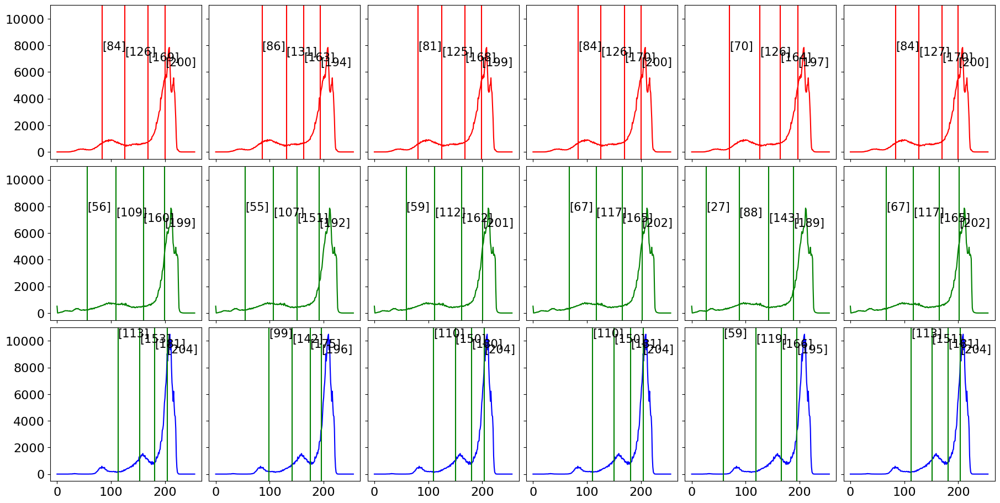

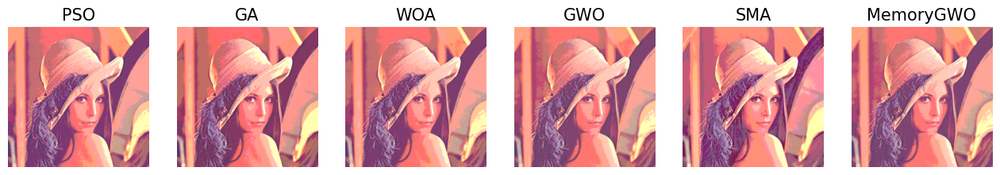

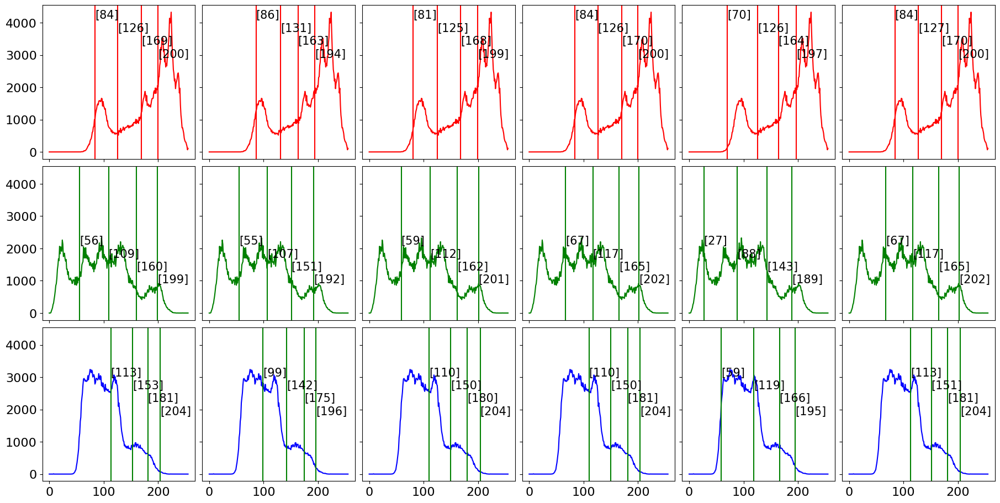

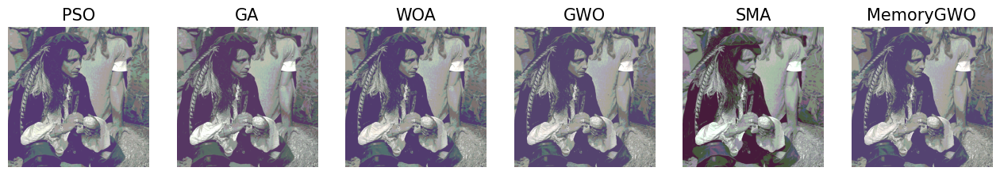

...

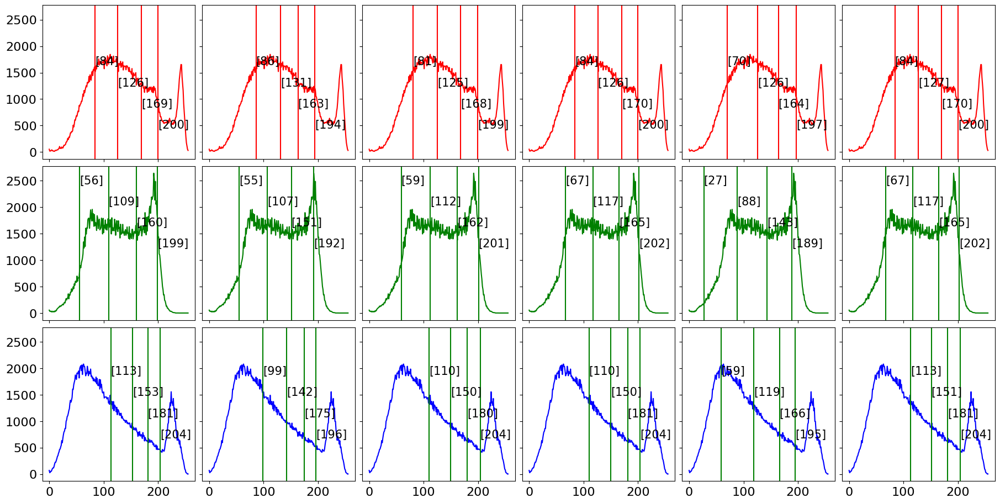

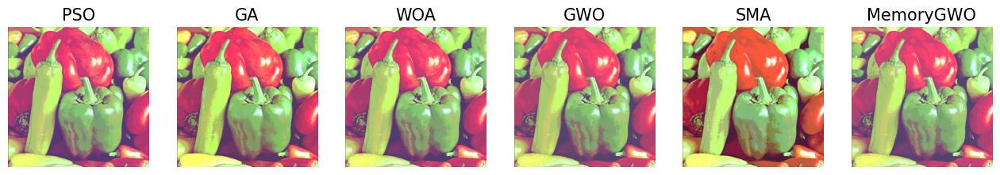

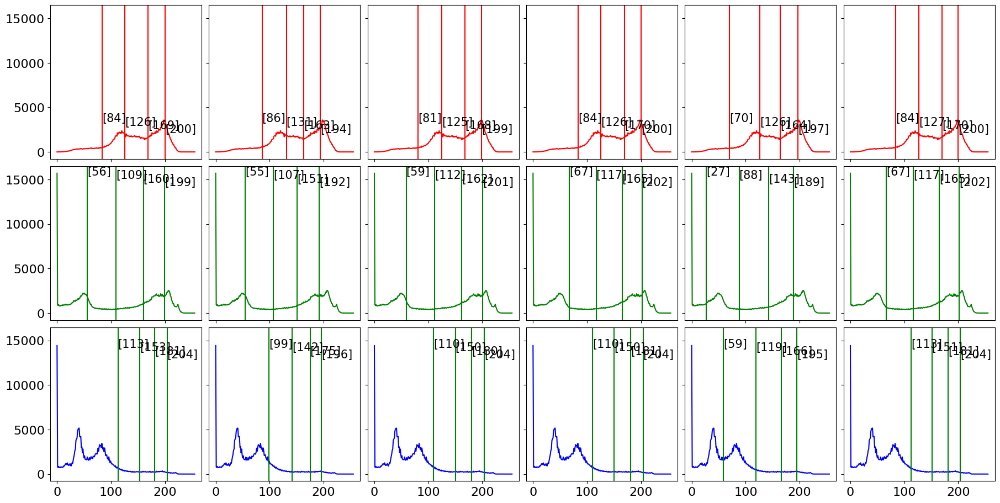

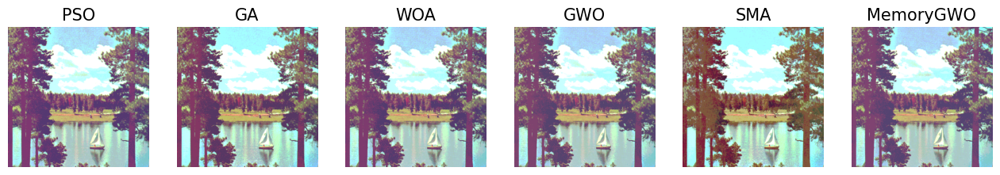

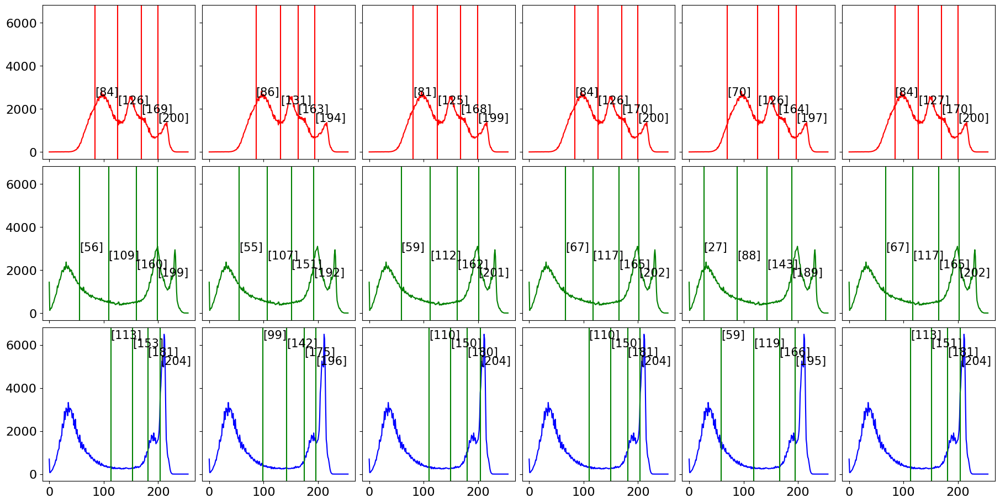

In [29]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400

## 5-Level

In [30]:
mLevel = 5
filtered_results_R_channel = threshold_r_merge[
    threshold_r_merge['thresholds']==mLevel
]
filtered_results_G_channel = threshold_g_merge[
    threshold_g_merge['thresholds']==mLevel
]
filtered_results_B_channel = threshold_b_merge[
    threshold_b_merge['thresholds']==mLevel
]
filtered_results_R_channel

,,thresholds,Thresholds R PSO,Thresholds R GWO,Thresholds R MemoryGWO,Thresholds R GA,Thresholds R SMA,Thresholds R WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[77, 116, 152, 183, 203]","[75, 113, 148, 180, 202]","[76, 113, 149, 180, 202]","[66, 112, 145, 175, 201]","[42, 93, 136, 174, 202]","[69, 108, 143, 177, 202]"
Lena.png,7,5,"[113, 145, 176, 202, 224]","[110, 143, 172, 198, 221]","[111, 144, 174, 199, 222]","[110, 142, 172, 199, 224]","[72, 123, 161, 192, 217]","[104, 137, 168, 195, 219]"
Male.tiff,11,5,"[26, 61, 97, 132, 170]","[28, 66, 101, 135, 172]","[29, 66, 101, 134, 172]","[30, 66, 102, 139, 189]","[20, 62, 102, 138, 194]","[15, 49, 90, 128, 167]"
Mandrill.tiff,15,5,"[58, 100, 133, 168, 210]","[73, 106, 138, 172, 212]","[70, 105, 137, 171, 212]","[66, 102, 136, 176, 213]","[24, 89, 134, 176, 218]","[43, 94, 130, 167, 210]"
Peppers.tiff,19,5,"[46, 93, 126, 156, 186]","[65, 104, 134, 162, 190]","[68, 106, 134, 163, 190]","[64, 103, 137, 165, 192]","[29, 74, 125, 158, 195]","[40, 85, 124, 156, 186]"
Sailboat on lake.tiff,23,5,"[86, 110, 137, 163, 192]","[85, 109, 135, 162, 191]","[85, 109, 135, 162, 191]","[75, 106, 134, 159, 190]","[21, 71, 121, 159, 194]","[64, 103, 131, 159, 191]"


In [31]:
filtered_results_B_channel

,,thresholds,Thresholds B PSO,Thresholds B GWO,Thresholds B MemoryGWO,Thresholds B GA,Thresholds B SMA,Thresholds B WOA
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[112, 147, 174, 195, 208]","[106, 144, 171, 193, 208]","[109, 146, 171, 193, 208]","[85, 127, 160, 182, 200]","[43, 99, 141, 174, 200]","[105, 142, 169, 191, 207]"
Lena.png,7,5,"[76, 96, 116, 141, 170]","[70, 93, 113, 138, 167]","[73, 94, 114, 138, 167]","[66, 92, 114, 140, 168]","[24, 65, 110, 140, 178]","[52, 83, 108, 133, 163]"
Male.tiff,11,5,"[27, 64, 99, 133, 170]","[28, 65, 100, 134, 172]","[28, 65, 100, 134, 172]","[29, 64, 100, 143, 178]","[16, 47, 89, 131, 184]","[14, 46, 86, 125, 166]"
Mandrill.tiff,15,5,"[47, 80, 113, 151, 198]","[50, 83, 116, 155, 200]","[53, 84, 117, 155, 200]","[56, 87, 123, 162, 205]","[12, 61, 113, 157, 197]","[21, 63, 100, 144, 194]"
Peppers.tiff,19,5,"[24, 54, 79, 109, 157]","[24, 55, 81, 112, 160]","[25, 55, 82, 113, 160]","[24, 56, 85, 114, 167]","[11, 48, 87, 129, 167]","[12, 39, 68, 101, 152]"
Sailboat on lake.tiff,23,5,"[35, 63, 103, 154, 195]","[37, 66, 106, 157, 196]","[37, 65, 106, 157, 196]","[38, 72, 115, 152, 194]","[19, 62, 106, 157, 194]","[20, 47, 90, 143, 190]"


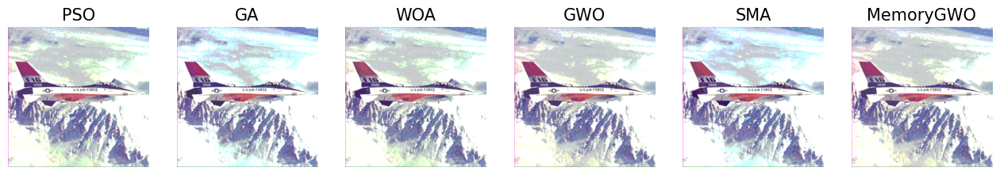

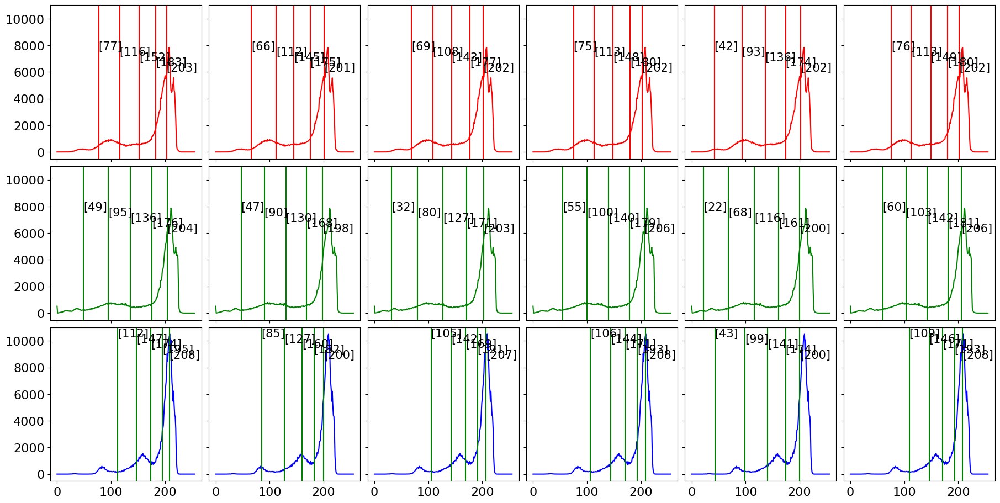

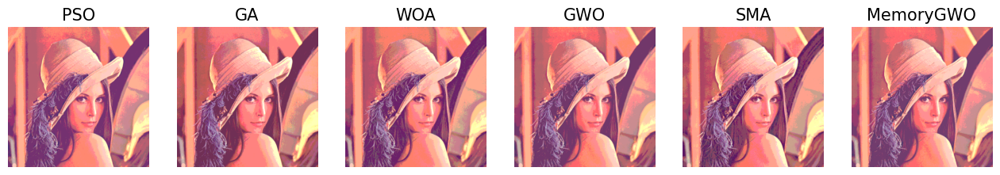

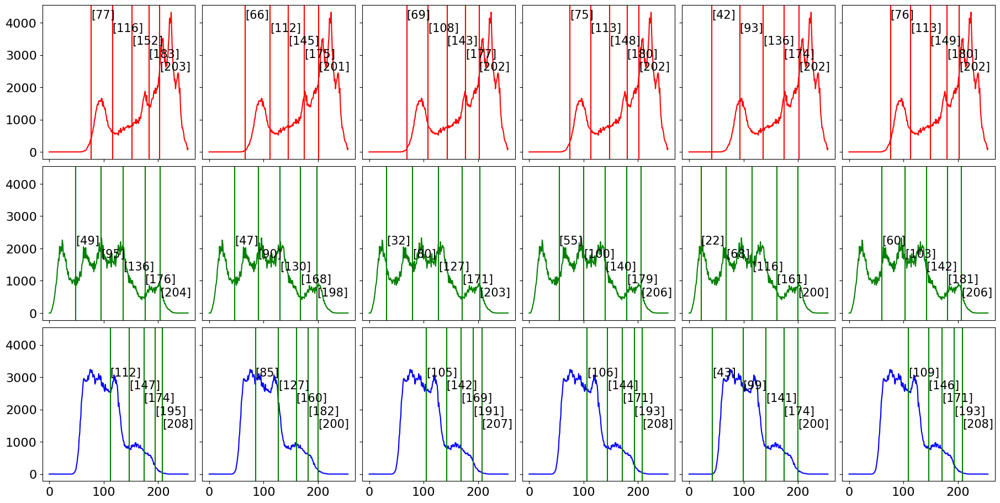

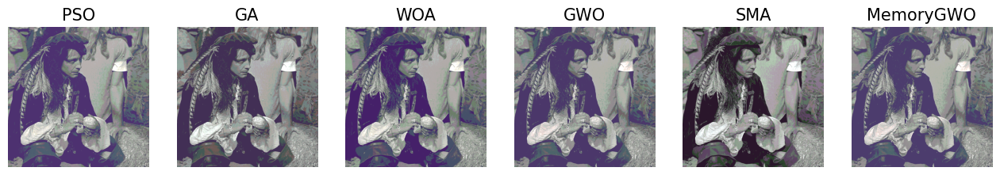

...

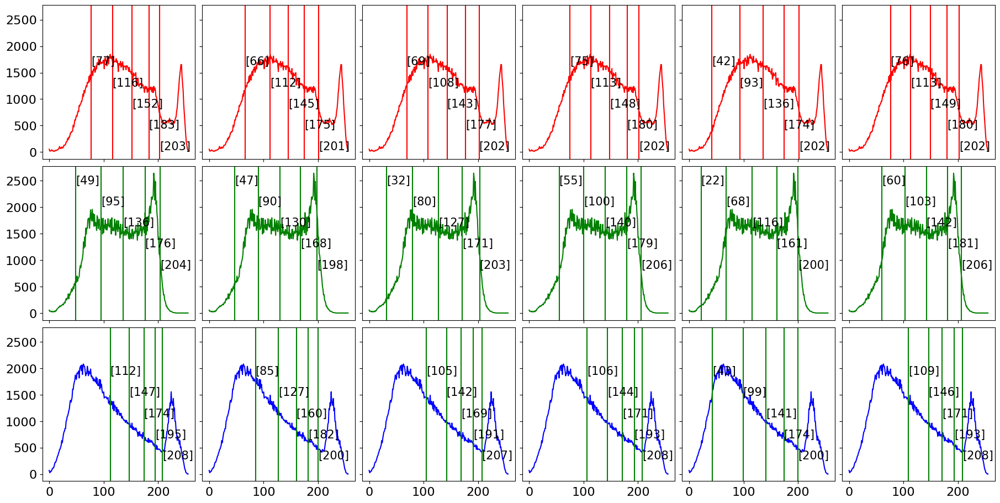

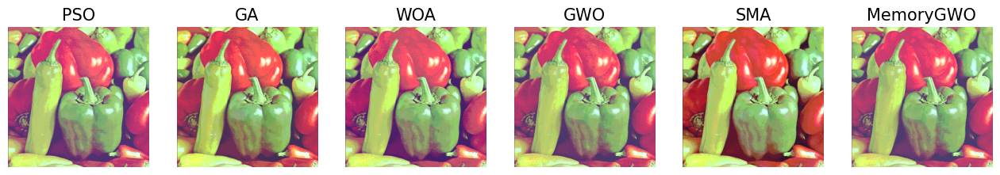

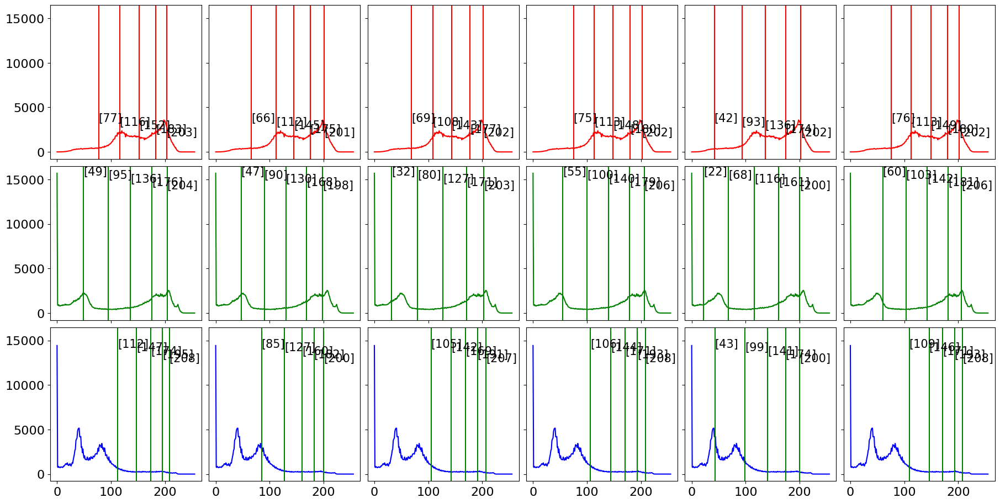

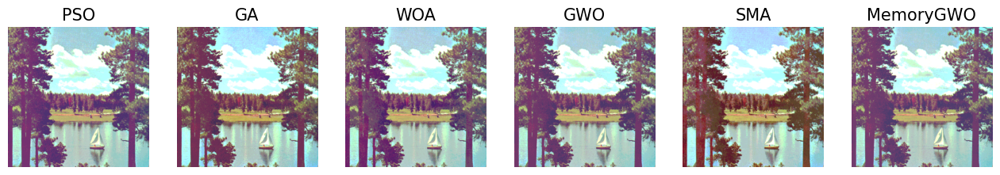

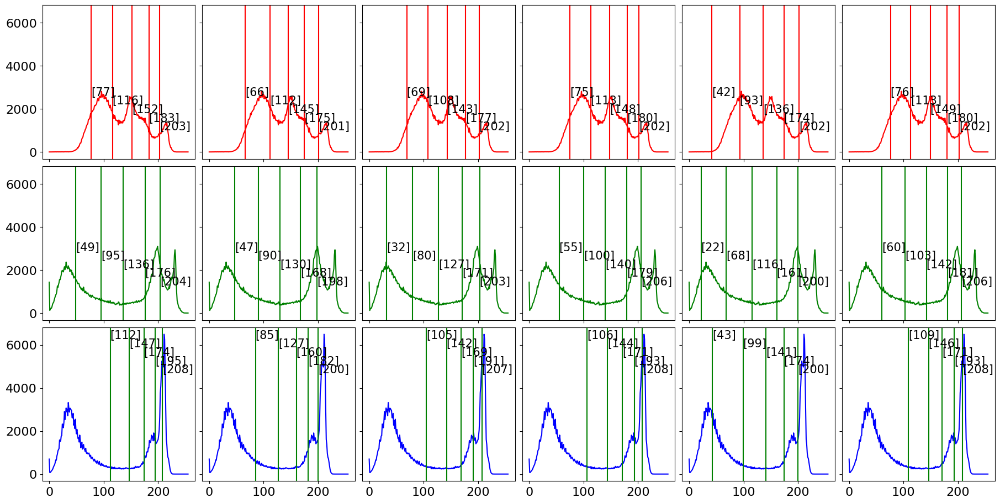

In [32]:
for image_name, image_array in rgb_misc_dataset.items():
    # split image array into 3 channels
    r,g,b = cv2.split(image_array)
    
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16,5))
    # For first row, plot the segmented color image from each methods
    for idx, algo in enumerate(algorithms):
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # segmenting image using the threshold
        regions_r = Utilization().digitize(r, r_thresh)
        regions_g = Utilization().digitize(g, g_thresh)
        regions_b = Utilization().digitize(b, b_thresh)
        
        # merge segmented results from each channel
        segmented_color_image = cv2.merge((regions_r, regions_g, regions_b))
        
        # FIRST ROW PLOT
        ax_row1[idx].imshow(segmented_color_image)
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
    # For second, third, and fourth row we plot R,G,B channel histogram respectively
    fig, (ax_row2, ax_row3, ax_row4) = plt.subplots(
        nrows=3, 
        ncols=len(algorithms), 
        figsize=(3*len(algorithms), 3*3), 
        layout='constrained',
        sharex=True, 
        sharey=True
    )
    for idx, algo in enumerate(algorithms): 
        # get the mean threshold for R,G,B channel
        r_thresh = filtered_results_R_channel.loc['AirplaneF16.tiff']['Thresholds R {}'.format(algo)].values[0]
        g_thresh = filtered_results_G_channel.loc['AirplaneF16.tiff']['Thresholds G {}'.format(algo)].values[0]
        b_thresh = filtered_results_B_channel.loc['AirplaneF16.tiff']['Thresholds B {}'.format(algo)].values[0]
        
        # SECOND ROW PLOT
        R_hist = cv2.calcHist([image_array], [0], None, [256], (0, 256))
        y_max_r = R_hist[
            np.argmax(R_hist)
        ]
        ax_row2[idx].plot(R_hist, c='r', label='R')
        ax_row2[idx].tick_params(axis='x', labelsize=16)
        ax_row2[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for r_t in r_thresh:
            ax_row2[idx].axvline(r_t, color='r')
            ax_row2[idx].text(r_t, y_max_r-200-counter, '[{}]'.format(r_t),fontsize=15)
            counter+=400
        
        # THIRD ROW PLOT
        G_hist = cv2.calcHist([image_array], [1], None, [256], (0, 256))
        y_max_g = G_hist[
            np.argmax(G_hist)
        ]
        ax_row3[idx].plot(G_hist, c='g', label='G')
        ax_row3[idx].tick_params(axis='x', labelsize=16)
        ax_row3[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for g_t in g_thresh:
            ax_row3[idx].axvline(g_t, color='g')
            ax_row3[idx].text(g_t, y_max_g-200-counter, '[{}]'.format(g_t),fontsize=15)
            counter+=400
        
        # FOURTH ROW PLOT
        B_hist = cv2.calcHist([image_array], [2], None, [256], (0, 256))
        y_max_b = B_hist[
            np.argmax(B_hist)
        ]
        ax_row4[idx].plot(B_hist, c='b', label='B')
        ax_row4[idx].tick_params(axis='x', labelsize=16)
        ax_row4[idx].tick_params(axis='y', labelsize=16)
        counter=0
        for b_t in b_thresh:
            ax_row4[idx].axvline(b_t, color='g')
            ax_row4[idx].text(b_t, y_max_b-200-counter, '[{}]'.format(b_t),fontsize=15)
            counter+=400